# using chukar_v1.parquet

This notebook shows how to use the `mixit_chukar_v1.parquet` parquet file to
analyze preprocessed mixit and birdnet data. We will use remote locations, but
analysis is going to be much more efficient if you use local relative paths to
audio files.

In [160]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_parquet(
    "https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/chukar_v1.parquet"
)
# df = pd.read_parquet("../data/processed/mixit/chukar_v1.parquet")
df.head()

,start_sec,end_sec,confidence,birdnet_label,birdnet_common_name,filename,original_filename,source_number
0,3.0,6.0,0.4737,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0
1,3.0,6.0,0.2780,relpar1,Red-legged Partridge,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0
2,6.0,9.0,0.9972,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0
3,9.0,12.0,0.7671,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0
4,9.0,12.0,0.4160,relpar1,Red-legged Partridge,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0


In [18]:
df.original_filename.unique().size

39

# listen to an audio file

Note that the track with source number 0 is the track that is most likely to be the primary species.

It's also probably straightforward to build a small website using 11ty, but this notebook will do for now.

In [21]:
random_row = df.sample(1, random_state=20221030).iloc[0]
subset = df[df.original_filename == random_row.original_filename]
subset

,start_sec,end_sec,confidence,birdnet_label,birdnet_common_name,filename,original_filename,source_number
0,0.0,3.0,0.1738,squher1,Squacco Heron,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
1,0.0,3.0,0.1205,bicwre1,Bicolored Wren,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
2,3.0,6.0,0.3443,chukar,Chukar,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
3,3.0,6.0,0.1319,redjun,Red Junglefowl,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
4,6.0,9.0,0.9838,chukar,Chukar,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
5,9.0,12.0,0.8695,chukar,Chukar,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
6,9.0,12.0,0.1129,varcha1,Variable Chachalaca,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
7,12.0,15.0,0.2947,bcnher,Black-crowned Night-Heron,chukar/XC233760_source0.ogg,chukar/XC233760.ogg,0
0,0.0,3.0,0.1229,virrai,Virginia Rail,chukar/XC233760_source1.ogg,chukar/XC233760.ogg,1
1,3.0,6.0,0.3069,unknown,Power tools,chukar/XC233760_source1.ogg,chukar/XC233760.ogg,1


In [51]:
import librosa
import librosa.display
import soundfile as sf
import io
import numpy as np
import requests
import functools
from IPython.display import Audio, display


@functools.lru_cache(maxsize=32)
def fetch_audio(track_url):
    """Fetch audio from a remote source and read it as PCM data.

    We cache the data so we can run it multiple times without issues
    """
    fp = io.BytesIO(requests.get(track_url).content)
    y, sr = sf.read(fp)
    if y.shape[-1] > 1:
        y = librosa.to_mono(y.T)
    return y, sr


def get_track_url_original(filename):
    root_url = (
        "https://storage.googleapis.com/birdclef-2022/raw/birdclef-2022/train_audio"
    )
    return f"{root_url}/{filename}"


def get_track_url_mixit(filename):
    root_url = (
        "https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis"
    )
    return f"{root_url}/{filename}"


def plot_melspectogram(y, sr, n_mels=128, ax=None, **kwargs):
    """Plot a melspectrogram of an audio file."""
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, **kwargs)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, x_axis="time", y_axis="mel", sr=sr, ax=ax)
    plt.show()

audio for https://storage.googleapis.com/birdclef-2022/raw/birdclef-2022/train_audio/chukar/XC233760.ogg


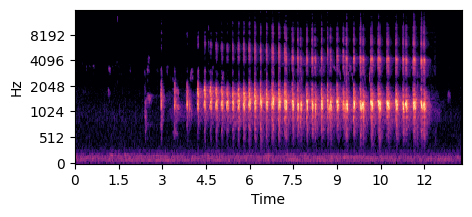

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC233760_source0.ogg


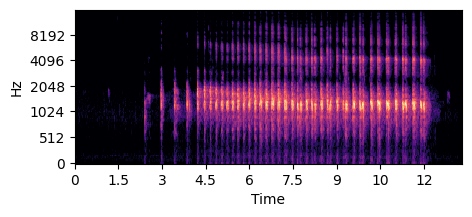

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC233760_source1.ogg


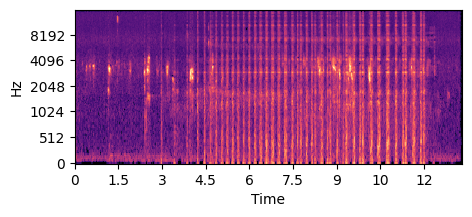

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC233760_source2.ogg


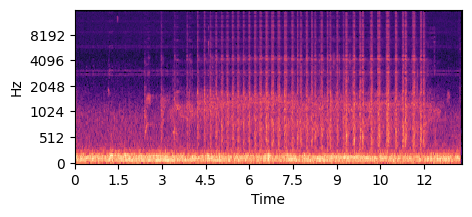

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC233760_source3.ogg


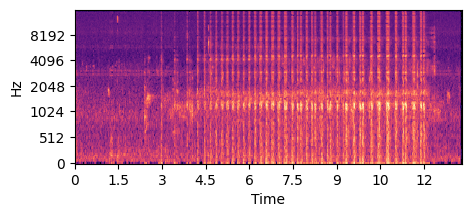

In [60]:
url = get_track_url_original(random_row.original_filename)
print(f"audio for {url}")
y, sr = fetch_audio(url)
fig = plt.figure(figsize=(5, 2))
plot_melspectogram(y, sr, ax=fig.gca())
display(Audio(y, rate=sr))
# NOTE: can also play the url directly
# display(Audio(url))

for row in sorted(subset.filename.unique().tolist()):
    url = get_track_url_mixit(row)
    print(f"audio for {url}")
    y, sr = fetch_audio(url)
    fig = plt.figure(figsize=(5, 2))
    plot_melspectogram(y, sr, ax=fig.gca())
    display(Audio(y, rate=sr))

## extracting 3 second clips

We focus on clips from audio from source number 0 where confidence is greater than 80% and randomly sample them from the dataset. We'll also annotate the dataset by merging it with the training metadata.

In [65]:
train_metadata_df = pd.read_csv(
    "https://storage.googleapis.com/birdclef-eda-f22/data/raw/birdclef-2022/train_metadata.csv"
)

In [73]:
clips_df = pd.merge(
    df[
        (df.source_number == 0) & (df.confidence > 0.8) & (df.birdnet_label == "chukar")
    ].sample(10, random_state=20221030),
    train_metadata_df[["filename", "primary_label", "secondary_labels", "type"]].rename(
        columns={"filename": "original_filename"}
    ),
    on="original_filename",
)

clips_df

,start_sec,end_sec,confidence,birdnet_label,birdnet_common_name,filename,original_filename,source_number,primary_label,secondary_labels,type
0,6.0,9.0,0.9326,chukar,Chukar,chukar/XC387754_source0.ogg,chukar/XC387754.ogg,0,chukar,[],['alarm call']
1,42.0,45.0,0.8501,chukar,Chukar,chukar/XC387754_source0.ogg,chukar/XC387754.ogg,0,chukar,[],['alarm call']
2,39.0,42.0,0.9400,chukar,Chukar,chukar/XC387754_source0.ogg,chukar/XC387754.ogg,0,chukar,[],['alarm call']
3,30.0,33.0,0.9644,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0,chukar,['chukar'],['advertising call']
4,27.0,30.0,0.9855,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0,chukar,['chukar'],['advertising call']
5,24.0,27.0,0.9906,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0,chukar,['chukar'],['advertising call']
6,21.0,24.0,0.9890,chukar,Chukar,chukar/XC120366_source0.ogg,chukar/XC120366.ogg,0,chukar,['chukar'],['advertising call']
7,0.0,3.0,0.8092,chukar,Chukar,chukar/XC523756_source0.ogg,chukar/XC523756.ogg,0,chukar,[],['call']
8,6.0,9.0,0.8703,chukar,Chukar,chukar/XC404865_source0.ogg,chukar/XC404865.ogg,0,chukar,[],['song']
9,0.0,3.0,0.9786,chukar,Chukar,chukar/XC404865_source0.ogg,chukar/XC404865.ogg,0,chukar,[],['song']


audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC387754_source0.ogg from 6.0 to 9.0
['alarm call']


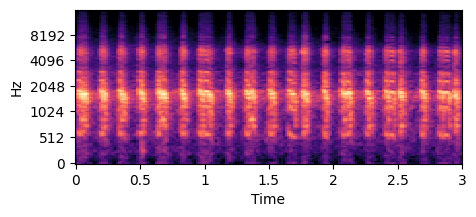

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC387754_source0.ogg from 42.0 to 45.0
['alarm call']


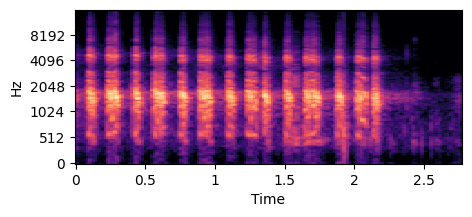

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC387754_source0.ogg from 39.0 to 42.0
['alarm call']


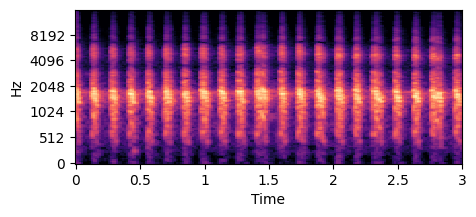

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC120366_source0.ogg from 30.0 to 33.0
['advertising call']


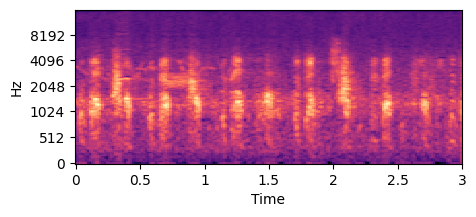

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC120366_source0.ogg from 27.0 to 30.0
['advertising call']


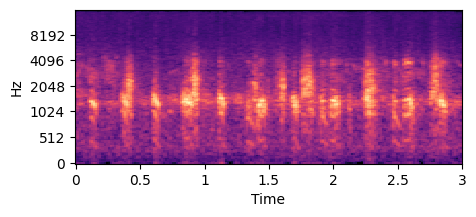

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC120366_source0.ogg from 24.0 to 27.0
['advertising call']


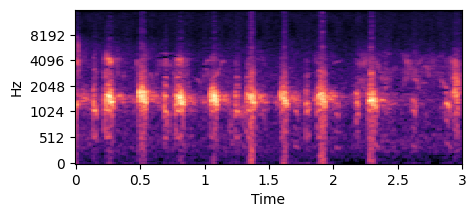

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC120366_source0.ogg from 21.0 to 24.0
['advertising call']


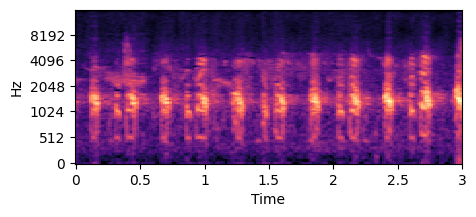

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC523756_source0.ogg from 0.0 to 3.0
['call']


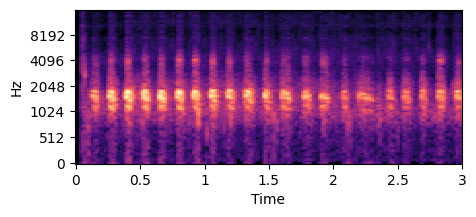

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC404865_source0.ogg from 6.0 to 9.0
['song']


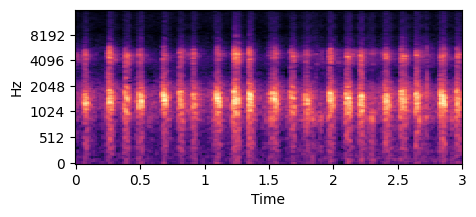

audio for https://storage.googleapis.com/birdclef-eda-f22/data/processed/mixit/analysis/chukar/XC404865_source0.ogg from 0.0 to 3.0
['song']


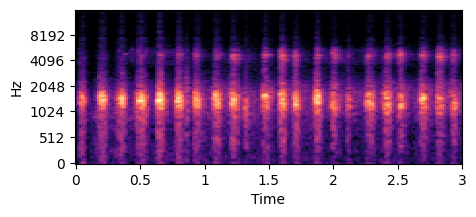

In [74]:
def extract_subset(y, sr, start, end):
    start = int(start * sr)
    end = int(end * sr)
    return y[start:end]


clips = []
for row in clips_df.itertuples():
    url = get_track_url_mixit(row.filename)
    y, sr = fetch_audio(url)
    y_sub = extract_subset(y, sr, row.start_sec, row.end_sec)
    clips.append(y_sub)
    print(f"audio for {url} from {row.start_sec} to {row.end_sec}")
    print(row.type)
    fig = plt.figure(figsize=(5, 2))
    plot_melspectogram(y_sub, sr, ax=fig.gca())
    display(Audio(y_sub, rate=sr))

# SiMPLe matrix profile

We install the following package:

- https://github.com/acmiyaguchi/simple-fast-python

In [75]:
! pip install simple-fast-python

You should consider upgrading via the 'F:\code\kaggle\birdclef-eda-f22\users\acmiyaguchi\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [91]:
from simple import simple_fast

# convert each clip into a melspectrogram
specs = []
for clip in clips:
    S = librosa.feature.melspectrogram(y=clip, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    specs.append(S_dB)

print(f"shape of spectogram: {specs[0].shape}")

shape of spectogram: (128, 188)


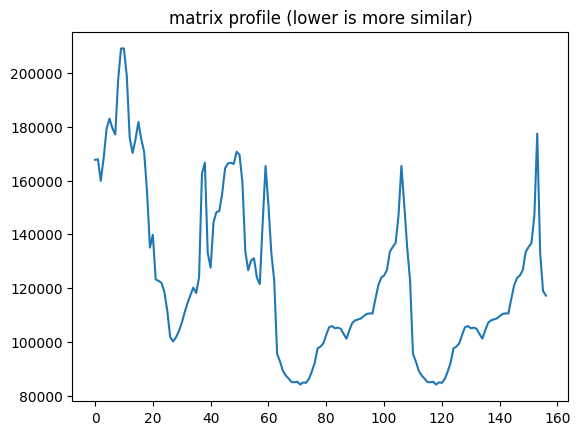

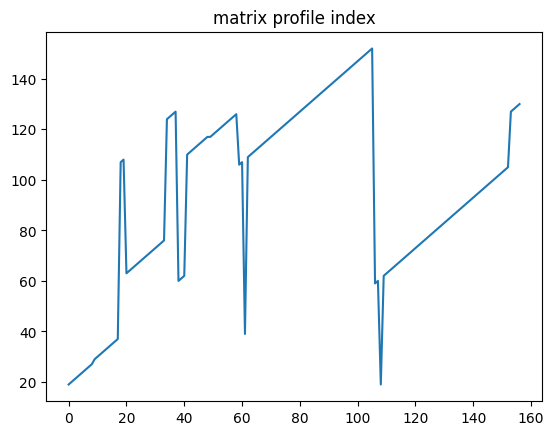

In [96]:
mp, pi = simple_fast(specs[0], specs[0], window_size=32)

plt.title("matrix profile (lower is more similar)")
plt.plot(mp)
plt.show()

plt.title("matrix profile index")
plt.plot(pi)
plt.show()

In [99]:
# create a matrix of distances in the dataset, using the median of the matrix
# profile


def compute_affinity(data, window=32):
    n = len(data)
    affinity = np.zeros((n, n))

    args = []
    for i in range(n):
        for j in range(i, n):
            args.append((i, j))

    for i, j in args:
        mp, _ = simple_fast(data[i], data[j], window)
        val = np.median(mp)
        affinity[i][j] = val
        affinity[j][i] = val
    return affinity


affinity = compute_affinity(specs)

In [121]:
len(clips_df.type.tolist())

10

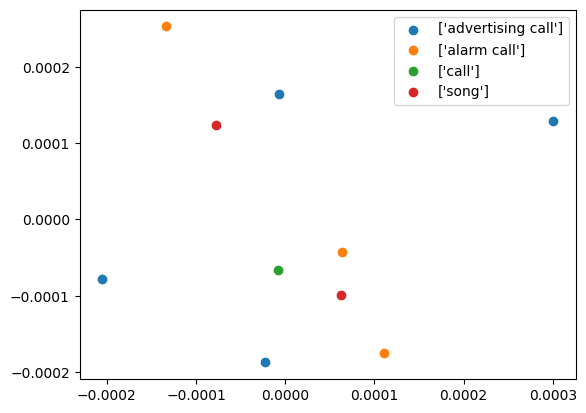

In [128]:
from sklearn.manifold import spectral_embedding
from sklearn.preprocessing import LabelEncoder

labels = clips_df.type.tolist()
le = LabelEncoder().fit(labels)

emb = spectral_embedding(affinity)
for label in le.classes_:
    # get indices of all the points with this label
    mask = pd.Series(labels) == label
    plt.scatter(emb[mask, 0], emb[mask, 1], label=label)
plt.legend()
plt.show()

We do it again, but this time in one big block without any sampling. Some other things to try:

- Per-Channel Energy Normalization on clips https://www.justinsalamon.com/uploads/4/3/9/4/4394963/lostanlen_pcen_spl2018.pdf
- Shorter than 3 second clips (which is a whole call, and not necessarily a syllable). The motif mining properties might be useful to grab short syllables.

In [139]:
df[
    (df.source_number == 0) & (df.confidence > 0.5) & (df.birdnet_label == "chukar")
].shape[0]

32

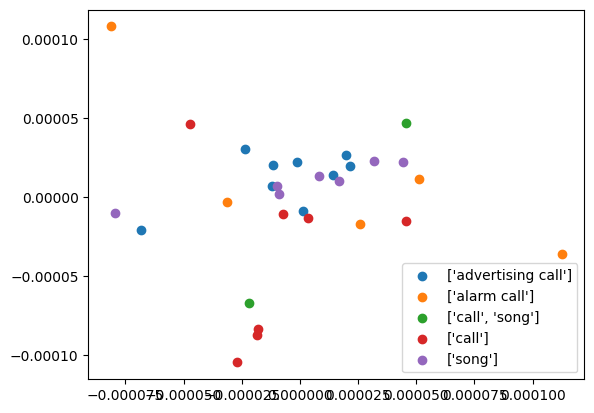

In [159]:
clips_df = pd.merge(
    df[
        (df.source_number == 0) & (df.confidence > 0.5) & (df.birdnet_label == "chukar")
    ],
    train_metadata_df[["filename", "primary_label", "secondary_labels", "type"]].rename(
        columns={"filename": "original_filename"}
    ),
    on="original_filename",
)

labels = []
clips = []
for row in clips_df.itertuples():
    url = get_track_url_mixit(row.filename)
    y, sr = fetch_audio(url)
    y_sub = extract_subset(y, sr, row.start_sec, row.end_sec)
    if y_sub.shape[0] != sr * 3:
        continue
    labels.append(row.type)
    clips.append(y_sub)

specs = []
for clip in clips:
    S = librosa.feature.melspectrogram(y=clip, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    specs.append(S_dB)

affinity = compute_affinity(specs)

le = LabelEncoder().fit(labels)
emb = spectral_embedding(affinity)

for label in le.classes_:
    # get indices of all the points with this label
    mask = pd.Series(labels) == label
    plt.scatter(emb[mask, 0], emb[mask, 1], label=label)

plt.legend()
plt.show()